In [2]:
from yolo3_one_file_to_detect_them_all import *
from keras import models
from keras.preprocessing import image
import tensorflow as tf
from matplotlib.patches import Rectangle
import matplotlib
import matplotlib.pyplot as plt
import glob

In [3]:
import cv2
 
src = cv2.imread('darsh2.jpg', cv2.IMREAD_UNCHANGED)

#percent by which the image is resized
scale_percent = 25

#calculate the 50 percent of original dimensions
width = int(src.shape[1] * scale_percent / 100)
height = int(src.shape[0] * scale_percent / 100)

# dsize
dsize = (width, height)

# resize image
output = cv2.resize(src, dsize)
print("here")
cv2.imshow("", output)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.imwrite('darsh1.png',output) 

AttributeError: 'NoneType' object has no attribute 'shape'

In [10]:
model = models.load_model('model.h5')

In [11]:
dog_image = image.load_img('dog.jpg', target_size=(416, 416))
dog_image = image.img_to_array(dog_image)
dog_image = dog_image.astype('float32')
dog_image /= 255.0

FileNotFoundError: [Errno 2] No such file or directory: 'dog.jpg'

In [12]:
# load the image to get its shape
dog_image = image.load_img('dog.jpg')
dog_image = image.load_img('man.pgm')
dog_image = image.load_img('downtown.png')
width, height = dog_image.size

FileNotFoundError: [Errno 2] No such file or directory: 'dog.jpg'

In [13]:
def load_image_pixels(filename, shape):
    # load the image to get its shape
    dog_image = image.load_img(filename)
    width, height = dog_image.size
    # load the image with the required size
    dog_image = image.load_img(filename, target_size=shape)
    # convert to numpy array
    dog_image = image.img_to_array(dog_image)
    # scale pixel values to [0, 1]
    dog_image = dog_image.astype('float32')
    dog_image /= 255.0
    # add a dimension so that we have one sample
    dog_image = tf.expand_dims(dog_image, 0)
    return dog_image, width, height

In [29]:
input_w, input_h = 416, 416
# define our new photo
photo_filename = 'frame192.png'
# load and prepare image
dog_image, image_w, image_h = load_image_pixels(photo_filename, (input_w, input_h))

In [30]:
yhat = model.predict(dog_image)
# summarize the shape of the list of arrays
print([a.shape for a in yhat])

[(1, 13, 13, 255), (1, 26, 26, 255), (1, 52, 52, 255)]


In [31]:
anchors = [[116,90, 156,198, 373,326], [30,61, 62,45, 59,119], [10,13, 16,30, 33,23]]
# define the probability threshold for detected objects
class_threshold = 0.6
boxes = list()
for i in range(len(yhat)):
    # decode the output of the network
    boxes += decode_netout(yhat[i][0], anchors[i], class_threshold, input_h, input_w)

In [32]:
correct_yolo_boxes(boxes, image_h, image_w, input_h, input_w)

In [33]:
do_nms(boxes, 0.5)

In [34]:
# get all of the results above a threshold
def get_boxes(boxes, labels, thresh):
	v_boxes, v_labels, v_scores = list(), list(), list()
	# enumerate all boxes
	for box in boxes:
		# enumerate all possible labels
		for i in range(len(labels)):
			# check if the threshold for this label is high enough
			if box.classes[i] > thresh:
				v_boxes.append(box)
				v_labels.append(labels[i])
				v_scores.append(box.classes[i]*100)
				# don't break, many labels may trigger for one box
	return v_boxes, v_labels, v_scores

In [35]:
labels = ["person", "bicycle", "car", "motorbike", "aeroplane", "bus", "train", "truck",
    "boat", "traffic light", "fire hydrant", "stop sign", "parking meter", "bench",
    "bird", "cat", "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe",
    "backpack", "umbrella", "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard",
    "sports ball", "kite", "baseball bat", "baseball glove", "skateboard", "surfboard",
    "tennis racket", "bottle", "wine glass", "cup", "fork", "knife", "spoon", "bowl", "banana",
    "apple", "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza", "donut", "cake",
    "chair", "sofa", "pottedplant", "bed", "diningtable", "toilet", "tvmonitor", "laptop", "mouse",
    "remote", "keyboard", "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator",
    "book", "clock", "vase", "scissors", "teddy bear", "hair drier", "toothbrush"]
# get the details of the detected objects
v_boxes, v_labels, v_scores = get_boxes(boxes, labels, class_threshold)

In [36]:

# summarize what we found
for i in range(len(v_boxes)):
    print(v_labels[i], v_scores[i])

traffic light 77.74287462234497
car 98.19285273551941
car 99.68320727348328
person 99.39634799957275
person 95.79412937164307


In [37]:
box = v_boxes[i]
y1, x1, y2, x2 = box.ymin, box.xmin, box.ymax, box.xmax
# calculate width and height of the box
width, height = x2 - x1, y2 - y1
# create the shape
rect = Rectangle((x1, y1), width, height, fill=False, color='white')
# draw the box
ax.add_patch(rect)

NameError: name 'ax' is not defined

In [38]:
label = "%s (%.3f)" % (v_labels[i], v_scores[i])
plt.text(x1, y1, label, color='white')

Text(279, 280, 'person (95.794)')

ValueError: Image size of 93526x60922 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 432x288 with 1 Axes>

In [39]:
def draw_boxes(filename, v_boxes, v_labels, v_scores):
    # load the image
    data = plt.imread(filename)
    #print("here")
    # plot the image
    plt.figure()
    plt.imshow(data)
    # get the context for drawing boxes
    ax = plt.gca()
    # plot each box
    #print("1here")
    for i in range(len(v_boxes)):
        box = v_boxes[i]
        # get coordinates
        y1, x1, y2, x2 = box.ymin, box.xmin, box.ymax, box.xmax
        # calculate width and height of the box
        width, height = x2 - x1, y2 - y1
        # create the shape
        rect = Rectangle((x1, y1), width, height, fill=False, color='white')
        # draw the box
        ax.add_patch(rect)
        # draw text and score in top left corner
        label = "%s (%.3f)" % (v_labels[i], v_scores[i])
        #plt.text(x1, y1, label, color='white')
        #print("2here")
    # show the plot
    #print("3here")
    #plt.show("this")
    return ax
    print("4here")
    plt.show("this")

<AxesSubplot:>

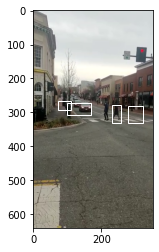

In [40]:
draw_boxes(photo_filename, v_boxes, v_labels, v_scores)

rec =  AxesSubplot(0.125,0.125;0.775x0.755)
here


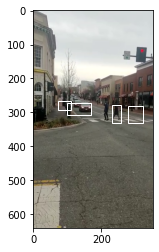

In [46]:
rec = draw_boxes(photo_filename, v_boxes, v_labels, v_scores)
print("rec = ",rec)
img_name = 0
npath = "C:\\VT\\fall21\\computer vision\\pythonProject\\comparision"
npath = (npath + "\\YOLO0.png")
plt.savefig(npath)
print("here")
#cv2.imwrite(os.path.join(npath, "YOLO%d.png" % img_name), rec)

In [26]:
import re
numbers = re.compile(r'(\d+)')
def numericalSort(value):
    parts = numbers.split(value)
    parts[1::2] = map(int, parts[1::2])
    return parts

photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame0.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame1.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame2.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame3.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame4.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame5.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame6.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame7.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame8.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame9.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame10.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame11.png
photo_filename

C:\Users\Jignasu\AppData\Local\Temp/ipykernel_7100/1473975033.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame21.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame22.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame23.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame24.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame25.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame26.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame27.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame28.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame29.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame30.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame31.png
photo_filename -  C:\VT\fall21\computer vision\pythonProject\frames_VT\frame32.png
phot

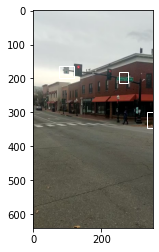

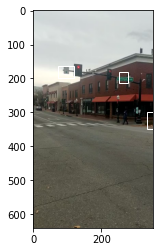

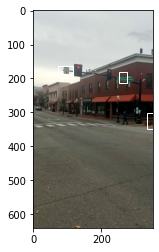

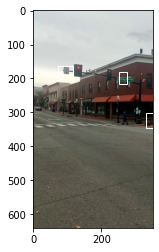

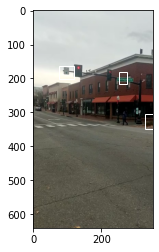

...

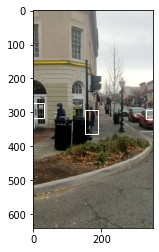

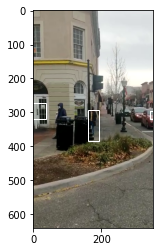

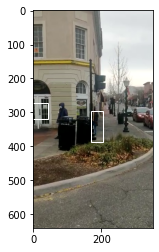

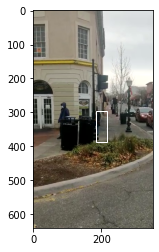

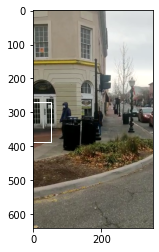

In [28]:
input_w, input_h = 416, 416
img_name = 0
# define our new photo
#photo_filename = 'dog.jpg'
#photo_filename = 'man.pgm'
#photo_filename = 'downtown.png'
# load and prepare image
path = "C:\\VT\\fall21\\computer vision\\pythonProject\\frames_VT"
npath = "C:\\VT\\fall21\\computer vision\\pythonProject\\o_frames_VT_YOLO\\frame"
for photo_filename in sorted(glob.glob(os.path.join(path, "*.png")), key=numericalSort):
    print("photo_filename - ",photo_filename)
    dog_image, image_w, image_h = load_image_pixels(photo_filename, (input_w, input_h))
    yhat = model.predict(dog_image)
    boxes = list()
    for i in range(len(yhat)):
        # decode the output of the network
        boxes += decode_netout(yhat[i][0], anchors[i], class_threshold, input_h, input_w)
    correct_yolo_boxes(boxes, image_h, image_w, input_h, input_w)
    do_nms(boxes, 0.5)
    v_boxes, v_labels, v_scores = get_boxes(boxes, labels, class_threshold)
    rec = draw_boxes(photo_filename, v_boxes, v_labels, v_scores)
    #plt.show()
    #print("npath - ",npath)
    nnpath = (npath + "%d.png" % img_name)
    #print("nnpath - ", nnpath)
    plt.savefig(nnpath)
    img_name +=1
    #cv2.imwrite(os.path.join(npath, "frame%d.png" % img_name), img)